<a href="https://colab.research.google.com/github/Ikeda33/codespaces-railstutorial/blob/main/se_vit2_50epoch_flower_D_se_G_sa_FID_KID_devide_1_color_relativistic1_hinge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#パッケージのダウンロード


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import argparse

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim

In [5]:
import torchvision.transforms as transforms

In [6]:
import torchvision.datasets as dset

In [7]:
import torchvision.utils as vutils

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import tqdm

In [9]:
import glob

In [10]:
from torch.utils.data import Dataset
from PIL import Image

In [11]:
from torch.utils.data import DataLoader
import torchvision

In [12]:
!pip install torchmetrics
!pip install torchmetrics[image]

!pip install torch-fidelity

from torchmetrics.image.inception import InceptionScore


import torchmetrics
import torch_fidelity

import torch
_ = torch.manual_seed(123)
from torchmetrics.image.fid import FrechetInceptionDistance
fid = FrechetInceptionDistance(feature=2048)

from torchmetrics.image.kid import KernelInceptionDistance


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 11.7 MB/s eta 0:00:00


Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 299MB/s]


In [13]:
kid = KernelInceptionDistance(subset_size=15)

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Metric `Kernel Inception Distance` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)  # noqa: B028


In [14]:
#ハイパーパラメータの設定

In [15]:
parser = argparse.ArgumentParser()
parser.add_argument("--n_epoch", type = int, default=50)
parser.add_argument("--batch_size", type = int, default=32)
parser.add_argument("--lr_g", type = float, default=2e-4)
parser.add_argument("--lr_d", type = float, default=3e-4)
parser.add_argument("--nch_g", type = int, default=64)
parser.add_argument("--nch_d", type = int, default=64)
parser.add_argument("--z_dim", type = int, default=100)
parser.add_argument("--beta1", type = float, default=0.5)

opt = parser.parse_args(args=[])
print(opt)

Namespace(n_epoch=50, batch_size=32, lr_g=0.0002, lr_d=0.0003, nch_g=64, nch_d=64, z_dim=100, beta1=0.5)


In [16]:
class ImageDataset(Dataset):
    def __init__(self,  transform = None):
        super().__init__()
        self.file_list = glob.glob("/content/drive/MyDrive/102flowers (2)/jpg/*.jpg")#/content/drive/MyDrive/img_align_celeba.zip
        #self.file_list = glob.glob("/content/drive/MyDrive/cityscapes/cityscapes_data/train/*.jpg" )#/content/drive/MyDrive/cityscapes/cityscapes_data/train
        #self.file_list = glob.glob("/content/drive/MyDrive/Test/**/*.jpg" )#fruits
       # self.file_list = glob.glob("/content/drive/MyDrive/img_align_celeba.zip/jpg/*.jpg")#C:\Users\ikeda\Downloads\img_align_celeba\img_align_celeba
        #self.file_list = glob.glob("/content/drive/MyDrive/–¢Šm”F 758452(1).crdownload/*.jpg")
        self.transform = transform


    def __getitem__(self, index):
        if self.transform is not None:
            img = self.transform(Image.open(self.file_list[index]))
        else:
            img = Image.open(self.file_list[index])
        return img

    def __len__(self):
        return len(self.file_list)

In [17]:
from torchvision.transforms.transforms import CenterCrop

transform = transforms.Compose([

    transforms.Resize(80),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
                               transforms.Normalize((0.5,),(0.5,))])

In [18]:
#dataset = dset.MNIST("./", train = True, download = True,transform = transform)
dataset = ImageDataset(transform = transform)
#dataset = torchvision.datasets.CelebA("./", split = "test", download = True,transform = transform) #Cityscapes
#dataset = torchvision.datasets.Cityscapes("C:\Users\ikeda\Downloads\cityscapes\cityscapes_data\cityscapes_data", split='train', mode='fine', target_type='color')


In [19]:
dataloader = DataLoader(dataset = dataset, batch_size = opt.batch_size,num_workers = 2,  shuffle = True)

In [20]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [21]:
#モデルの設定

In [22]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [23]:
class ResidualBlock_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE_G(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [24]:
class ResidualBlock_1(nn.Module):#実質パディングとスペクトラム正規化とインスタンス正規化
  def __init__(self, in_channels):
    super().__init__()
    self.conv_layers = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),
        nn.ReLU(inplace = True),

        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),

    )
  def forward(self, x):
    out = self.conv_layers(x)
    out = out + x
    return out

In [25]:
class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        #out_channels = in_channels // n_divide
        out_channels = 1

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [26]:
#import torch
#from layers.transformer.ScaledDotProductAttention import ScaledDotProductAttention
#from torch import nn


class MultiHeadAttention(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.Conv2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)

        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out


In [27]:

class MultiHeadAttention_G(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE_G(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        qkv = self.relu(qkv)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)
        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out

In [28]:
class SelfAttention_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        out_channels = in_channels // n_divide
      #  out_channels = 1

        self.fx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.gx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [29]:
class PF(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) -x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x= self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [30]:
"""    def __init__(self, in_channels):
        super().__init__()
        n_divide = 8
        out_channels = in_channels // n_divide
        self.dim = 3

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool= nn.AvgPool2d(kernel_size =self.dim , stride = 1, padding = 0, count_include_pad=False)
        self.sigmoid = nn.Sigmoid()


    def forward(self, x):
        B, C, H, W = x.size()
        z = self.pre_bn(x)
        z = self.pool(z, self.dim = H)

        z = self.conv1(z)
        z = self.relu(z)

        z = self.conv2(z)
        z = self.sigmoid(z)

        z = torch.einsum("bchw,bchw->bchw",(x, z))
        out = x + self.gamma * z
        return out
"""

'    def __init__(self, in_channels):\n        super().__init__()\n        n_divide = 8\n        out_channels = in_channels // n_divide\n        self.dim = 3\n\n        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm\n        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#\n        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#\n        self.gamma = nn.Parameter(torch.zeros(1))\n        self.softmax = nn.Softmax(dim = -2)#規格化するため -2\n        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1\n        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))\n        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること\n        self.pre_bn = nn.BatchNorm2d(in_channels)\n        self.bn = n

In [31]:
class SE(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
           # nn.Linear(channel, channel// reduction , bias=False),
            (nn.Conv2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            (nn.Conv2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        #y = self.avg_pool(x).view(b, c)
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)




In [32]:
class SE_G(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            #nn.Linear(channel, channel// reduction , bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

In [33]:
#nn.ConvTranspose2d
class PF_G(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) - x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x = self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [34]:
"""(((W - K + 2P)/S) + 1)
    Here W = Input size
    K = Filter size
    S = Stride
    P = Padding
    ((Input_size-kernel_size + 2*Padding)/stride)+ 1
    この式を使用できます[(W−K+2P)/S]+1。

W は入力ボリュームです - あなたの場合は 128
Kはカーネルサイズです - あなたの場合は5です
P はパディングです - あなたの場合は 0 だと思います
S はストライドです - あなたが提供していません。
したがって、次の式に入力します。
for example
Output_Shape = (128-5+0)/1+1

Output_Shape = (124,124,40)
output==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W
    """



'(((W - K + 2P)/S) + 1)\n    Here W = Input size\n    K = Filter size\n    S = Stride\n    P = Padding\n    ((Input_size-kernel_size + 2*Padding)/stride)+ 1\n    この式を使用できます[(W−K+2P)/S]+1。\n\nW は入力ボリュームです - あなたの場合は 128\nKはカーネルサイズです - あなたの場合は5です\nP はパディングです - あなたの場合は 0 だと思います\nS はストライドです - あなたが提供していません。\nしたがって、次の式に入力します。\nfor example\nOutput_Shape = (128-5+0)/1+1\n\nOutput_Shape = (124,124,40)\noutput==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W\n    '

In [35]:
class VIT(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)

        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size = 3, stride = 1, padding = 3//2)
        self.attention = SelfAttention(in_channels)
        self.se_block_0 = SE(in_channels)
        self.se_block_1 = SE(out_channels)

        self.flat = nn.Flatten()

        self.linear_1 = nn.Linear(32,64, bias=False)
        self.linear_2 = nn.Linear( 32,32, bias=False)#if ( 64,32, bias=False)  -> mat1 and mat2 shapes cannot be multiplied (131072x32 and 64x32)


    def shortcut(self, x):

        x = self.conv3(x)
        x = self.bn(x)

        return x

    def forward(self, x):

        identity = x#入力
        x = self.pre_bn(x)
        x = self.se_block_0(x)
       # x = self.attention(x) - x
        #x = x + identity


      #  identity = x#入力
        x = self.pre_bn(x)
       # b, c, h, w = x.size()
        x = self.conv1(x)


      #  x = self.linear_1(x).view(b, -1, h, w)
        x = self.relu(x)
       # x = self.linear_2(x).view(b, -1, h, w)


      #  x =  self.shortcut(identity) + x

        x = self.bn(x)

        return x

In [36]:
#nn.ConvTranspose2d
class VIT_G(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size=1 -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.attention = MultiHeadAttention_G(in_channels)

    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.attention(x) - x
        x = x + identity

        #identity = x#入力
        x = self.pre_bn(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [37]:
class Generator(nn.Module):
    def __init__(self,pf, vit, resnet,res_net,sa,z_dim = opt.z_dim, ngf = opt.nch_g, nc = 3):# ものくろだからnc=1 カラーならnc=3
        super().__init__()

        self.convt1 = self.conv_trans_layers(z_dim, 8*ngf, 4,1,0 )# ngf = the number of channels

        self.convt2 = self.conv_trans_layers(8*ngf, 4*ngf, 4, 2, 1 )
        self.convt3 = self.conv_trans_layers(4*ngf,  2*ngf, 4,2,1)
        self.convt4 = self.conv_trans_layers(2*ngf,  ngf, 4,2,1 )

        self.pf1 = pf(z_dim, 8*ngf)
        self.vit1 = vit(z_dim, 8*ngf)

        self.pf2 = pf(8*ngf, 4*ngf)
        self.vit2 = vit(8*ngf, 4*ngf)

        self.pf3 = pf(4*ngf,  2*ngf)
        self.vit3 = vit(4*ngf,  2*ngf)

        self.pf4 = pf(2*ngf,  ngf)
        self.vit4 = vit(2*ngf,  ngf)

        self.convt5 = nn.Sequential(
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1),
            #self.conv_trans_layers(ngf, nc, 4,2,1  )
            nn.Tanh()
        )


    @staticmethod
    def conv_trans_layers(in_channels, out_channels, kernel_size, stride, padding, has_norm=True,attention=True, res_net= False, se = False):
        layers = [nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding))]#spectralnorm
        if has_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        #layers.append(nn.ReLU(inplace = True))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE_G(out_channels))
        if attention:
            layers.append(SelfAttention_G(out_channels))
        if res_net:
            layers.append(ResidualBlock_G(out_channels))



        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.convt1(x)

        out = self.convt2(out)

        out = self.convt3(out)

        out = self.convt4(out)

        out = self.convt5(out)


        return out

In [38]:
from pickle import FALSE
class Discriminator(nn.Module):
    def __init__(self,pf,vit ,resnet,res_net,sa,nc = 3, ndf = opt.nch_d):# ものくろだからnc=1 カラーならnc=3
        super().__init__()
        self.conv1 = self.conv_layers(nc, ndf)
        self.pf1 = pf(nc,ndf)
        self.vit1 = vit(nc,ndf)

        self.conv2 = self.conv_layers(ndf, 2*ndf )
        self.pf2 = pf(ndf, 2*ndf)
        self.vit2 = vit(ndf, 2*ndf)

        self.conv3 = self.conv_layers(2*ndf, 4*ndf )
        self.pf3 = pf(2*ndf, 4*ndf )
        self.vit3 = vit(2*ndf, 4*ndf )

        self.conv4 = self.conv_layers(4*ndf, 8*ndf)
        self.pf4 = pf(4*ndf, 8*ndf)
        self.vit4 = vit(4*ndf, 8*ndf)

        self.vit5 = vit(8*ndf, 16*ndf)

        self.conv5 =  nn.Conv2d(8*ndf, 1,  4)
        #self.conv6 =  nn.Conv2d(16*ndf, 1,  4)


    @staticmethod
    def conv_layers(in_channels, out_channels, kernel_size=4, stride=2, padding=1, has_batch_norm = True, attention = False, res_net = False, se = False):
        layers = [nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding))]
        if has_batch_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE(out_channels))
        if attention:
            layers.append(SelfAttention(out_channels))

        if res_net:
            layers.append(ResidualBlock(out_channels))


        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.conv1(x)

        out = self.vit2(out)

        out = self.vit3(out)

        out = self.vit4(out)

        out = self.conv5(out)

        return out

In [39]:
#モデルのトレーニング

In [40]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [41]:
device

device(type='cuda')

In [42]:
netG = Generator(PF_G,VIT_G,ResidualBlock,ResidualBlock_1,SelfAttention, z_dim=opt.z_dim , ngf=opt.nch_g ).to(device)
netG.apply(weights_init)
print(netG)

netD = Discriminator(PF,VIT,ResidualBlock,ResidualBlock_1,SelfAttention, nc = 3 , ndf=opt.nch_d ).to(device)# ものくろだからnc=1 カラーならnc=3
netD.apply(weights_init)
print(netD)

Generator(
  (convt1): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): ConvTranspose2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
      (softmax): Softmax(dim=-2)
    )
  )
  (convt2): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(256, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(256, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): ConvTranspo

In [43]:
#criterion = nn.BCELoss()
#criterion = torch.nn.HingeEmbeddingLoss()
optimizerG = optim.Adam(netG.parameters(), lr = opt.lr_g, betas= (opt.beta1, 0.999), weight_decay = 1e-5)
optimizerD = optim.Adam(netD.parameters(), lr = opt.lr_d, betas= (opt.beta1, 0.999), weight_decay = 1e-5)

100%|██████████| 103/103 [01:00<00:00,  1.69it/s]


epoch: 0, lossD:0.9033554501614525, lossG:6.452399117275349,lossG_fake:3.0603621260633744, lossG_real:3.3920369773235137 ,equality:-0.3316748512601393


evaluate:149.83738708496094,kid_mean:0.091690294444561, kid_std:0.02164408005774021,kid_:(tensor(0.0917), tensor(0.0216))


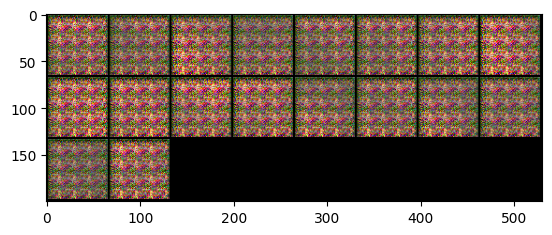

100%|██████████| 103/103 [00:24<00:00,  4.28it/s]


epoch: 1, lossD:1.2130651256991822, lossG:5.308560591299557,lossG_fake:3.0261676461951246, lossG_real:2.282392965937124 ,equality:0.7437746802580008


evaluate:141.19638061523438,kid_mean:0.09988317638635635, kid_std:0.03788651525974274,kid_:(tensor(0.0999), tensor(0.0379))


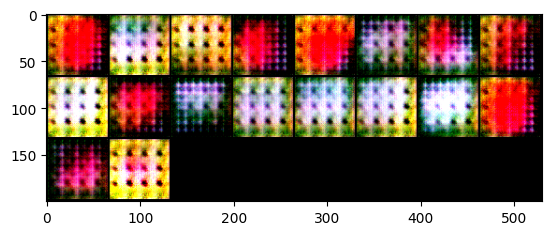

100%|██████████| 103/103 [00:24<00:00,  4.17it/s]


epoch: 2, lossD:1.486922391410013, lossG:3.4897258513182114,lossG_fake:1.9185326492902144, lossG_real:1.5711931892969075 ,equality:0.34733945999330684


evaluate:128.71905517578125,kid_mean:0.08015187084674835, kid_std:0.04041445255279541,kid_:(tensor(0.0802), tensor(0.0404))


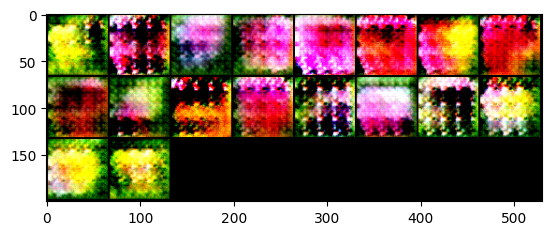

100%|██████████| 103/103 [00:25<00:00,  4.05it/s]


epoch: 3, lossD:1.394958122262677, lossG:3.5387060225588605,lossG_fake:1.9547264911596058, lossG_real:1.5839795429729722 ,equality:0.3707469481866337


evaluate:131.0172119140625,kid_mean:0.08645868301391602, kid_std:0.03865482658147812,kid_:(tensor(0.0865), tensor(0.0387))


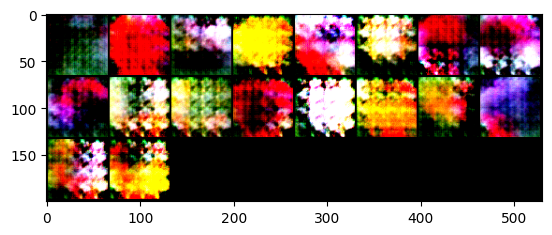

100%|██████████| 103/103 [00:25<00:00,  4.09it/s]


epoch: 4, lossD:1.4586712775878536, lossG:3.4868649348471927,lossG_fake:1.9273683503993506, lossG_real:1.5594966023871042 ,equality:0.3678717480122464


evaluate:121.30540466308594,kid_mean:0.08045676350593567, kid_std:0.0346246138215065,kid_:(tensor(0.0805), tensor(0.0346))


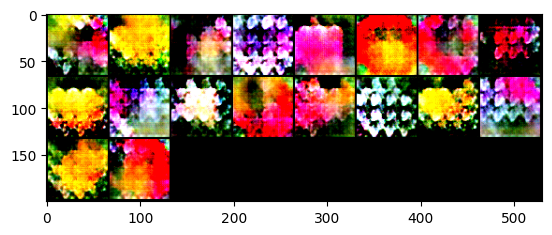

100%|██████████| 103/103 [00:25<00:00,  4.10it/s]


epoch: 5, lossD:1.52534574328117, lossG:3.366002196247138,lossG_fake:1.8633913698705655, lossG_real:1.5026108095946822 ,equality:0.36078056027588334


evaluate:124.120361328125,kid_mean:0.08186902105808258, kid_std:0.04092193767428398,kid_:(tensor(0.0819), tensor(0.0409))


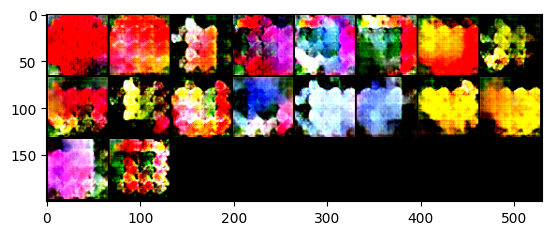

100%|██████████| 103/103 [00:25<00:00,  4.09it/s]


epoch: 6, lossD:1.552224978659917, lossG:3.322186349665077,lossG_fake:1.819404283484209, lossG_real:1.5027820693636404 ,equality:0.31662221412056857


evaluate:114.15424346923828,kid_mean:0.08250992745161057, kid_std:0.048276543617248535,kid_:(tensor(0.0825), tensor(0.0483))


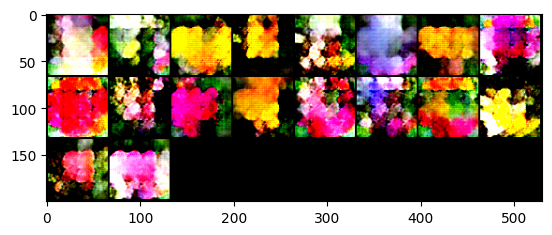

100%|██████████| 103/103 [00:25<00:00,  4.10it/s]


epoch: 7, lossD:1.5370558245668133, lossG:3.37989586533852,lossG_fake:1.8425231795866512, lossG_real:1.5373726909600416 ,equality:0.30515048862660965


evaluate:118.43302154541016,kid_mean:0.0777345597743988, kid_std:0.031553179025650024,kid_:(tensor(0.0777), tensor(0.0316))


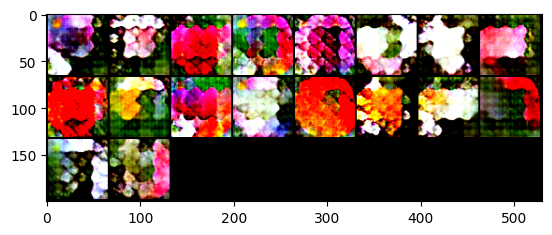

100%|██████████| 103/103 [00:25<00:00,  4.10it/s]


epoch: 8, lossD:1.4684329333814603, lossG:3.5301491103126006,lossG_fake:1.9200068694873922, lossG_real:1.6101422280941196 ,equality:0.30986464139327263


evaluate:117.57827758789062,kid_mean:0.06824510544538498, kid_std:0.03300734981894493,kid_:(tensor(0.0682), tensor(0.0330))


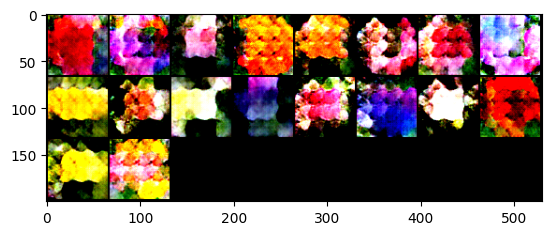

100%|██████████| 103/103 [00:25<00:00,  4.10it/s]


epoch: 9, lossD:1.3952446643588612, lossG:3.553685401249858,lossG_fake:1.906272035200619, lossG_real:1.64741336518121 ,equality:0.2588586700194091


evaluate:117.40690612792969,kid_mean:0.08182401955127716, kid_std:0.035390570759773254,kid_:(tensor(0.0818), tensor(0.0354))


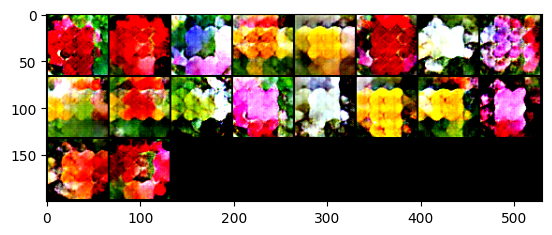

100%|██████████| 103/103 [00:25<00:00,  4.10it/s]


epoch: 10, lossD:1.3815159496751803, lossG:3.588361807239866,lossG_fake:1.9171118093925772, lossG_real:1.6712499990046603 ,equality:0.24586181038791688


evaluate:116.86787414550781,kid_mean:0.07716487348079681, kid_std:0.037621814757585526,kid_:(tensor(0.0772), tensor(0.0376))


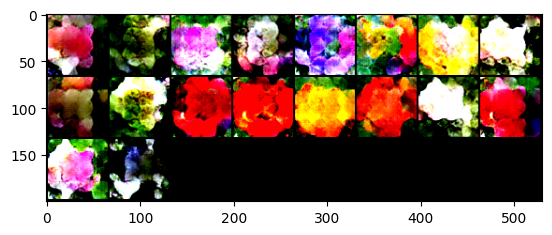

100%|██████████| 103/103 [00:25<00:00,  4.11it/s]


epoch: 11, lossD:1.4112532619133735, lossG:3.587247795271642,lossG_fake:1.907512354040609, lossG_real:1.6797354435457768 ,equality:0.22777691049483217


evaluate:119.13312530517578,kid_mean:0.07509464770555496, kid_std:0.03975895419716835,kid_:(tensor(0.0751), tensor(0.0398))


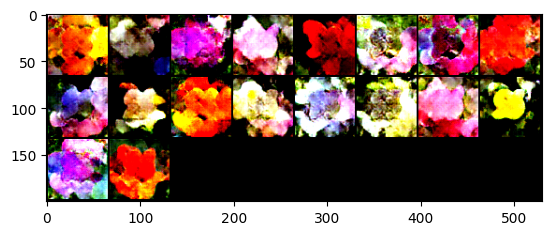

100%|██████████| 103/103 [00:25<00:00,  4.11it/s]


epoch: 12, lossD:1.3676708259628814, lossG:3.664467332432571,lossG_fake:1.9483617955041164, lossG_real:1.7161055372177976 ,equality:0.2322562582863188


evaluate:118.64435577392578,kid_mean:0.08757726848125458, kid_std:0.04531678929924965,kid_:(tensor(0.0876), tensor(0.0453))


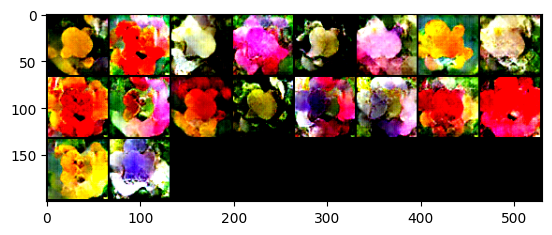

100%|██████████| 103/103 [00:25<00:00,  4.11it/s]


epoch: 13, lossD:1.3501386636669197, lossG:3.7605784564342315,lossG_fake:1.9806657332239799, lossG_real:1.779912729865139 ,equality:0.20075300335884094


evaluate:119.76443481445312,kid_mean:0.09050930291414261, kid_std:0.04706853628158569,kid_:(tensor(0.0905), tensor(0.0471))


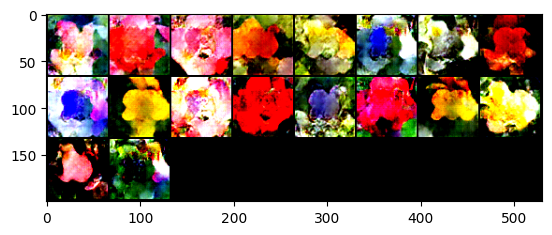

100%|██████████| 103/103 [00:25<00:00,  4.12it/s]


epoch: 14, lossD:1.3223782361132428, lossG:3.8110096176851145,lossG_fake:1.9945892830496852, lossG_real:1.8164203282698845 ,equality:0.17816895477980066


evaluate:121.13882446289062,kid_mean:0.0798686295747757, kid_std:0.03984338417649269,kid_:(tensor(0.0799), tensor(0.0398))


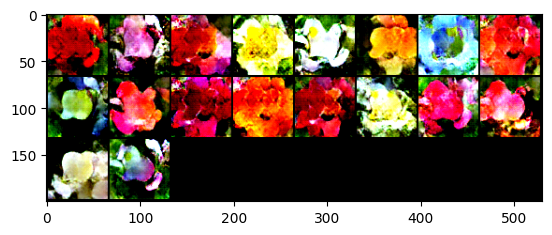

100%|██████████| 103/103 [00:25<00:00,  4.11it/s]


epoch: 15, lossD:1.2594979989875867, lossG:3.881452657644031,lossG_fake:2.018286614742094, lossG_real:1.8631660460847095 ,equality:0.15512056865738444


evaluate:121.03226470947266,kid_mean:0.0895744115114212, kid_std:0.042239949107170105,kid_:(tensor(0.0896), tensor(0.0422))


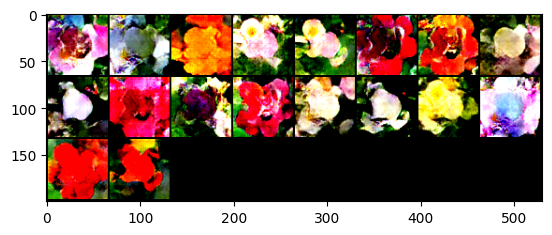

100%|██████████| 103/103 [00:24<00:00,  4.13it/s]


epoch: 16, lossD:1.2400832216716506, lossG:4.051174450846552,lossG_fake:2.1424408199139013, lossG_real:1.9087336335367369 ,equality:0.23370718637716448


evaluate:124.21312713623047,kid_mean:0.08159991353750229, kid_std:0.03650732710957527,kid_:(tensor(0.0816), tensor(0.0365))


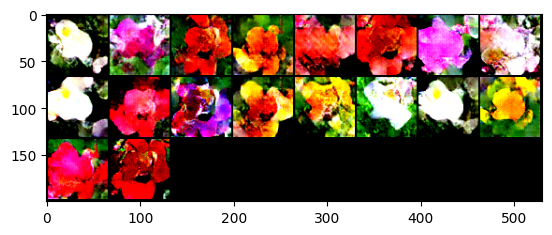

100%|██████████| 103/103 [00:24<00:00,  4.13it/s]


epoch: 17, lossD:1.2306912292554542, lossG:4.054990983703761,lossG_fake:2.1237038686437515, lossG_real:1.931287106379722 ,equality:0.1924167622640296


evaluate:124.99146270751953,kid_mean:0.08680035918951035, kid_std:0.03964467719197273,kid_:(tensor(0.0868), tensor(0.0396))


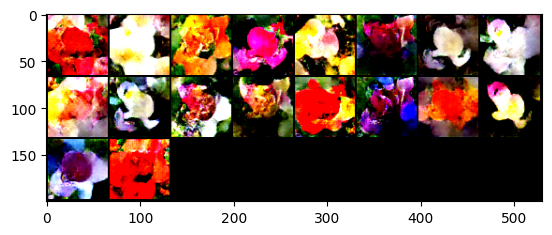

100%|██████████| 103/103 [00:24<00:00,  4.13it/s]


epoch: 18, lossD:1.1713308550200416, lossG:4.1881641508306116,lossG_fake:2.19550431295506, lossG_real:1.9926598095199437 ,equality:0.2028445034351165


evaluate:125.87245178222656,kid_mean:0.08685801178216934, kid_std:0.039286281913518906,kid_:(tensor(0.0869), tensor(0.0393))


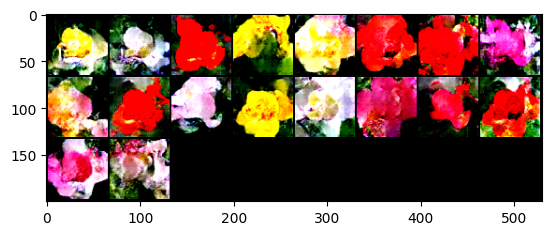

100%|██████████| 103/103 [00:24<00:00,  4.14it/s]


epoch: 19, lossD:1.159638555304518, lossG:4.300641895497887,lossG_fake:2.2627851621618547, lossG_real:2.0378567263918015 ,equality:0.22492843577005317


evaluate:126.6558609008789,kid_mean:0.08079154789447784, kid_std:0.038010310381650925,kid_:(tensor(0.0808), tensor(0.0380))


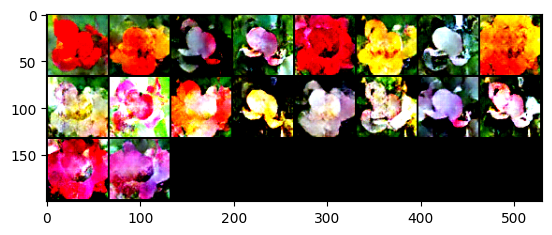

100%|██████████| 103/103 [00:24<00:00,  4.14it/s]


epoch: 20, lossD:1.1285421784641674, lossG:4.261343837941735,lossG_fake:2.1979761250968117, lossG_real:2.0633677087941216 ,equality:0.13460841630269016


evaluate:127.92010498046875,kid_mean:0.08437936753034592, kid_std:0.04845283180475235,kid_:(tensor(0.0844), tensor(0.0485))


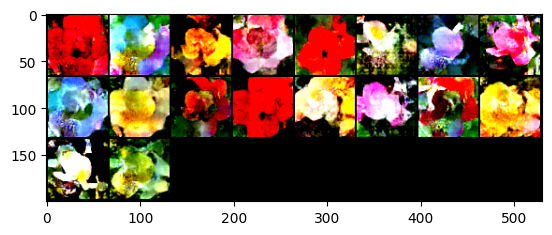

100%|██████████| 103/103 [00:24<00:00,  4.12it/s]


epoch: 21, lossD:1.0551647057811033, lossG:4.34807165849556,lossG_fake:2.274591403968126, lossG_real:2.073480270730639 ,equality:0.2011111332374873


evaluate:128.1480712890625,kid_mean:0.08661676198244095, kid_std:0.04024616256356239,kid_:(tensor(0.0866), tensor(0.0402))


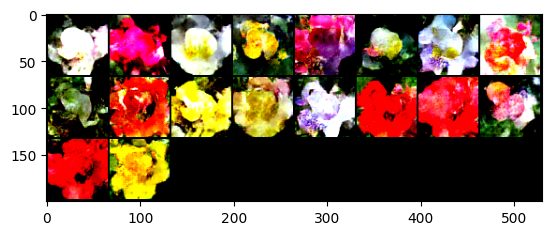

100%|██████████| 103/103 [00:24<00:00,  4.12it/s]


epoch: 22, lossD:0.9841679412763096, lossG:4.547977012337991,lossG_fake:2.3627352344179617, lossG_real:2.185241770975798 ,equality:0.17749346344216388


evaluate:131.73074340820312,kid_mean:0.09137600660324097, kid_std:0.045143332332372665,kid_:(tensor(0.0914), tensor(0.0451))


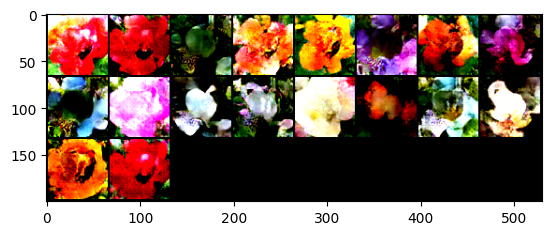

100%|██████████| 103/103 [00:25<00:00,  4.12it/s]


epoch: 23, lossD:0.997834112748359, lossG:4.5975368763636615,lossG_fake:2.3979687453473657, lossG_real:2.1995681153917777 ,equality:0.19840062995558805


evaluate:130.2686767578125,kid_mean:0.09451714158058167, kid_std:0.0501956008374691,kid_:(tensor(0.0945), tensor(0.0502))


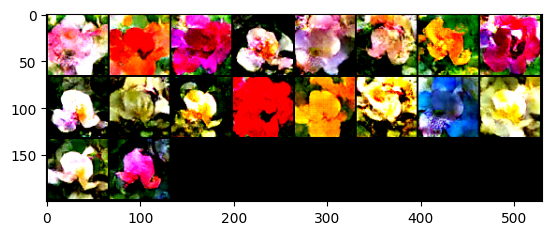

100%|██████████| 103/103 [00:24<00:00,  4.12it/s]


epoch: 24, lossD:1.009274419071605, lossG:4.661818064532234,lossG_fake:2.4389391234777507, lossG_real:2.222878980983808 ,equality:0.21606014249394256


evaluate:129.44483947753906,kid_mean:0.09470677375793457, kid_std:0.0453672893345356,kid_:(tensor(0.0947), tensor(0.0454))


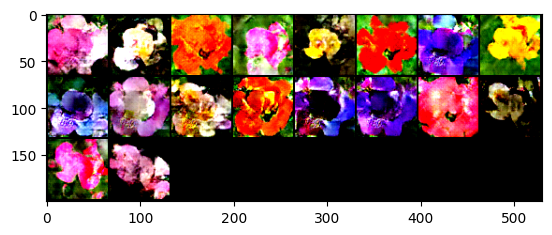

100%|██████████| 103/103 [00:24<00:00,  4.14it/s]


epoch: 25, lossD:0.9524639387732571, lossG:4.78678857007073,lossG_fake:2.450937915774225, lossG_real:2.3358506635554788 ,equality:0.11508725221874627


evaluate:124.08032989501953,kid_mean:0.08546363562345505, kid_std:0.03806488215923309,kid_:(tensor(0.0855), tensor(0.0381))


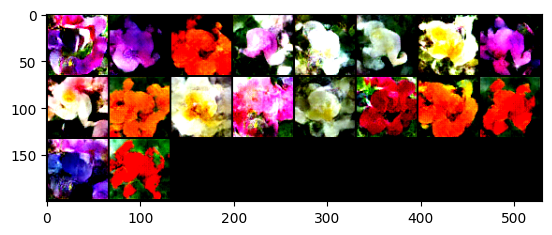

100%|██████████| 103/103 [00:24<00:00,  4.13it/s]


epoch: 26, lossD:0.878208749502608, lossG:4.905449779288283,lossG_fake:2.5127418318998465, lossG_real:2.392707928870488 ,equality:0.12003390302935824


evaluate:123.14014434814453,kid_mean:0.09625810384750366, kid_std:0.049511320888996124,kid_:(tensor(0.0963), tensor(0.0495))


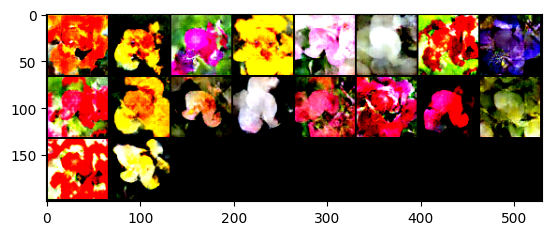

100%|██████████| 103/103 [00:24<00:00,  4.12it/s]


epoch: 27, lossD:0.8401809411430822, lossG:5.029835224151611,lossG_fake:2.6012908231864853, lossG_real:2.4285444108027856 ,equality:0.1727464123836997


evaluate:124.6094741821289,kid_mean:0.09228315949440002, kid_std:0.04676658660173416,kid_:(tensor(0.0923), tensor(0.0468))


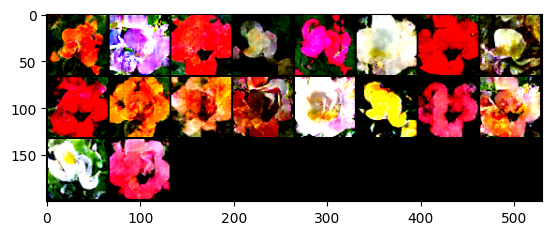

100%|██████████| 103/103 [00:24<00:00,  4.13it/s]


epoch: 28, lossD:0.8430929539851773, lossG:5.107883601512723,lossG_fake:2.645897140780699, lossG_real:2.4619864584172815 ,equality:0.18391068236341734


evaluate:127.21766662597656,kid_mean:0.09188256412744522, kid_std:0.045873161405324936,kid_:(tensor(0.0919), tensor(0.0459))


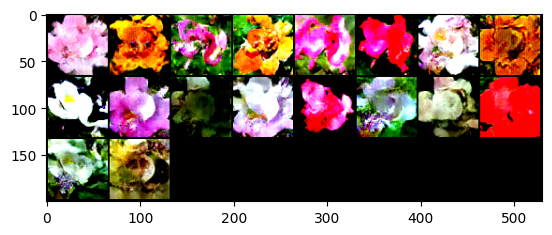

100%|██████████| 103/103 [00:24<00:00,  4.13it/s]


epoch: 29, lossD:0.7322361239241165, lossG:5.208489989771427,lossG_fake:2.6480905940231767, lossG_real:2.5603993992203646 ,equality:0.08769119480281207


evaluate:126.9973373413086,kid_mean:0.10113150626420975, kid_std:0.048658087849617004,kid_:(tensor(0.1011), tensor(0.0487))


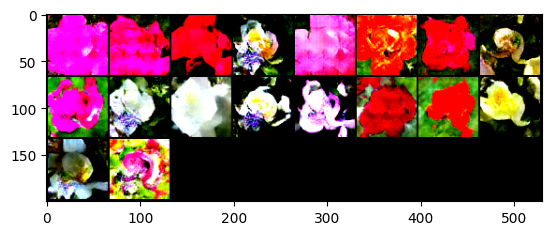

100%|██████████| 103/103 [00:24<00:00,  4.14it/s]


epoch: 30, lossD:0.7006862961406847, lossG:5.361228702137772,lossG_fake:2.7434503823808094, lossG_real:2.6177783255438203 ,equality:0.12567205683698912


evaluate:125.13742065429688,kid_mean:0.08748689293861389, kid_std:0.03964817523956299,kid_:(tensor(0.0875), tensor(0.0396))


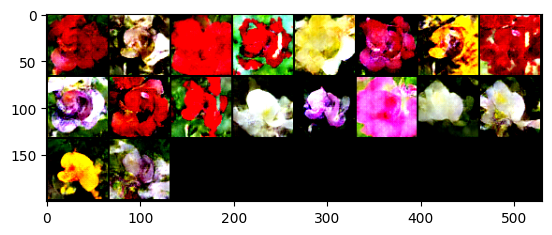

100%|██████████| 103/103 [00:24<00:00,  4.13it/s]


epoch: 31, lossD:0.7427310254967329, lossG:5.403289294937282,lossG_fake:2.7278735458272174, lossG_real:2.6754157219118286 ,equality:0.05245782391538878


evaluate:124.41820526123047,kid_mean:0.09612593799829483, kid_std:0.04153565689921379,kid_:(tensor(0.0961), tensor(0.0415))


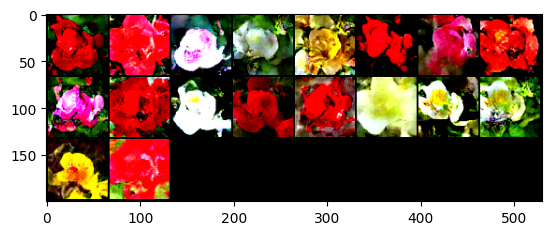

100%|██████████| 103/103 [00:24<00:00,  4.13it/s]


epoch: 32, lossD:0.6804383329106766, lossG:5.4868056889876575,lossG_fake:2.824930686973831, lossG_real:2.661874996805654 ,equality:0.16305569016817678


evaluate:124.14915466308594,kid_mean:0.09936786442995071, kid_std:0.04118317365646362,kid_:(tensor(0.0994), tensor(0.0412))


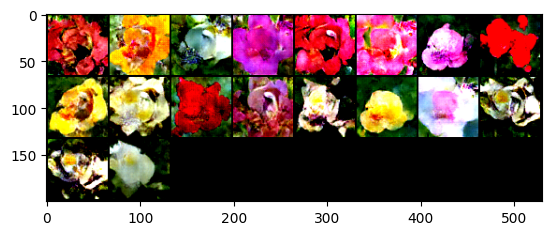

100%|██████████| 103/103 [00:24<00:00,  4.13it/s]


epoch: 33, lossD:0.6642238338595455, lossG:5.5826375924267815,lossG_fake:2.83387268862678, lossG_real:2.748764918845834 ,equality:0.08510776978094592


evaluate:124.71916198730469,kid_mean:0.09932170808315277, kid_std:0.04358009621500969,kid_:(tensor(0.0993), tensor(0.0436))


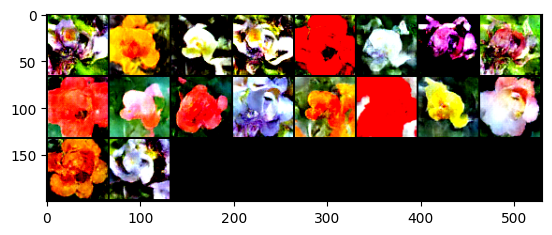

100%|██████████| 103/103 [00:24<00:00,  4.14it/s]


epoch: 34, lossD:0.5857770257783168, lossG:5.715315559535351,lossG_fake:2.884884198892464, lossG_real:2.8304313444396825 ,equality:0.05445285445278136


evaluate:123.53759002685547,kid_mean:0.09067470580339432, kid_std:0.04177207872271538,kid_:(tensor(0.0907), tensor(0.0418))


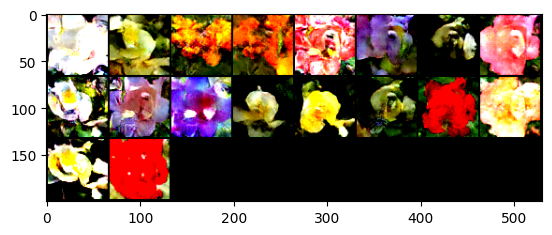

100%|██████████| 103/103 [00:24<00:00,  4.14it/s]


epoch: 35, lossD:0.6156373248227591, lossG:5.846513697244589,lossG_fake:2.999195266695856, lossG_real:2.8473184264979317 ,equality:0.15187684019792425


evaluate:123.50680541992188,kid_mean:0.09518028050661087, kid_std:0.04936661571264267,kid_:(tensor(0.0952), tensor(0.0494))


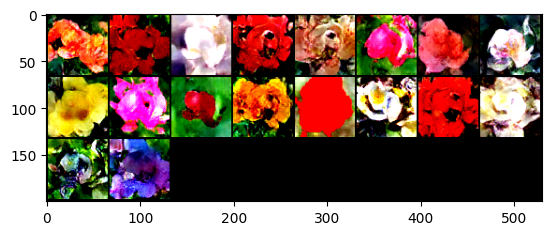

100%|██████████| 103/103 [00:24<00:00,  4.13it/s]


epoch: 36, lossD:0.6026068985534524, lossG:5.792361865923243,lossG_fake:2.9708894502769394, lossG_real:2.8214724341642508 ,equality:0.14941701611268865


evaluate:123.36337280273438,kid_mean:0.09240791201591492, kid_std:0.0422518253326416,kid_:(tensor(0.0924), tensor(0.0423))


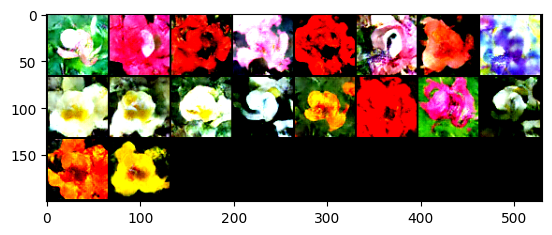

100%|██████████| 103/103 [00:24<00:00,  4.14it/s]


epoch: 37, lossD:0.5012552776165957, lossG:5.95898357872824,lossG_fake:3.0251901577977303, lossG_real:2.9337934136969372 ,equality:0.09139674410079301


evaluate:123.07906341552734,kid_mean:0.0908551812171936, kid_std:0.0420319102704525,kid_:(tensor(0.0909), tensor(0.0420))


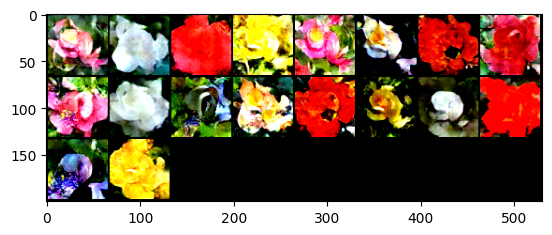

100%|██████████| 103/103 [00:24<00:00,  4.14it/s]


epoch: 38, lossD:0.5369069014938133, lossG:6.019939033730516,lossG_fake:3.0894034684283063, lossG_real:2.930535569353011 ,equality:0.15886789907529542


evaluate:124.12964630126953,kid_mean:0.09020914882421494, kid_std:0.04424634575843811,kid_:(tensor(0.0902), tensor(0.0442))


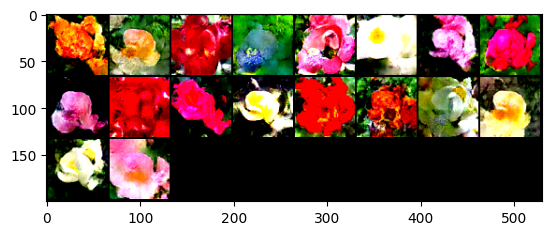

100%|██████████| 103/103 [00:24<00:00,  4.14it/s]


epoch: 39, lossD:0.49708446632455855, lossG:6.099800943170936,lossG_fake:3.038117779690085, lossG_real:3.0616831837348566 ,equality:-0.023565404044771476


evaluate:123.22198486328125,kid_mean:0.08254484832286835, kid_std:0.03922460973262787,kid_:(tensor(0.0825), tensor(0.0392))


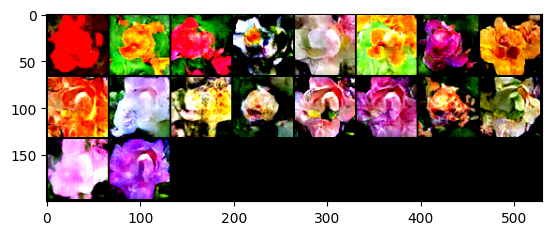

100%|██████████| 103/103 [00:24<00:00,  4.15it/s]


epoch: 40, lossD:0.44803450639965464, lossG:6.130230639744731,lossG_fake:3.106128080955987, lossG_real:3.0241025709411473 ,equality:0.08202551001483949


evaluate:122.89517974853516,kid_mean:0.09397575259208679, kid_std:0.046480871737003326,kid_:(tensor(0.0940), tensor(0.0465))


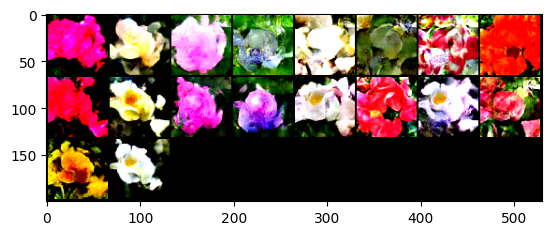

100%|██████████| 103/103 [00:24<00:00,  4.14it/s]


epoch: 41, lossD:0.4279690413437422, lossG:6.204439876149002,lossG_fake:3.178050679489247, lossG_real:3.026389185664723 ,equality:0.15166149382452376


evaluate:122.26935577392578,kid_mean:0.08606145530939102, kid_std:0.04296525567770004,kid_:(tensor(0.0861), tensor(0.0430))


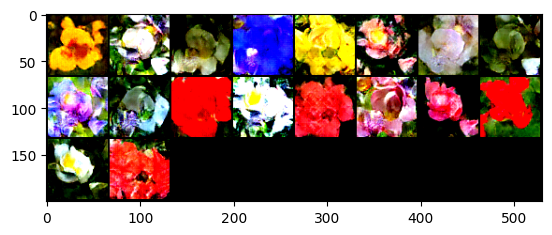

100%|██████████| 103/103 [00:24<00:00,  4.14it/s]


epoch: 42, lossD:0.4331697047986452, lossG:6.276169128788328,lossG_fake:3.165328099310977, lossG_real:3.1108410343961808 ,equality:0.05448706491479616


evaluate:122.56674194335938,kid_mean:0.09367069602012634, kid_std:0.03859540820121765,kid_:(tensor(0.0937), tensor(0.0386))


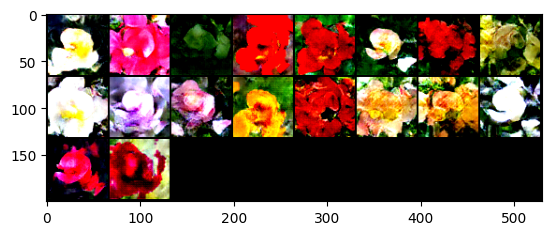

100%|██████████| 103/103 [00:24<00:00,  4.14it/s]


epoch: 43, lossD:0.40625811093351216, lossG:6.3957161394137785,lossG_fake:3.2254587354011908, lossG_real:3.1702574144289333 ,equality:0.055201320972257495


evaluate:121.41033172607422,kid_mean:0.08912212401628494, kid_std:0.04078010097146034,kid_:(tensor(0.0891), tensor(0.0408))


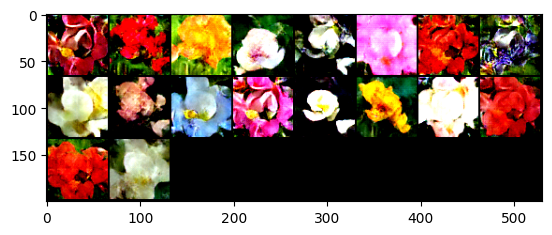

100%|██████████| 103/103 [00:24<00:00,  4.14it/s]


epoch: 44, lossD:0.45471220123536377, lossG:6.285853566475285,lossG_fake:3.121415273946466, lossG_real:3.1644382766149577 ,equality:-0.043023002668491905


evaluate:120.94874572753906,kid_mean:0.08030059933662415, kid_std:0.0432746447622776,kid_:(tensor(0.0803), tensor(0.0433))


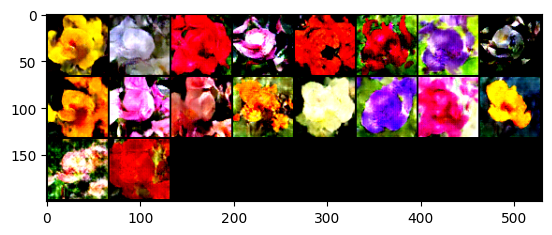

100%|██████████| 103/103 [00:24<00:00,  4.14it/s]


epoch: 45, lossD:0.362619350293597, lossG:6.53747125736718,lossG_fake:3.3119159809594017, lossG_real:3.225555271778292 ,equality:0.08636070918110983


evaluate:120.24129486083984,kid_mean:0.09310270100831985, kid_std:0.044515401124954224,kid_:(tensor(0.0931), tensor(0.0445))


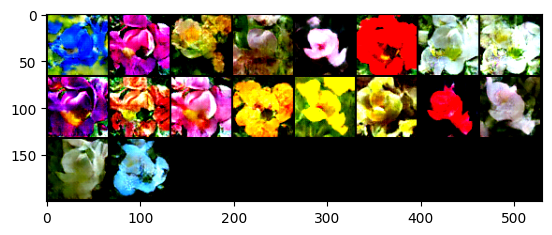

100%|██████████| 103/103 [00:24<00:00,  4.15it/s]


epoch: 46, lossD:0.33074577228681556, lossG:6.48173325270125,lossG_fake:3.2825312691116797, lossG_real:3.199201966373666 ,equality:0.08332930273801376


evaluate:119.92369842529297,kid_mean:0.08822152018547058, kid_std:0.0468452125787735,kid_:(tensor(0.0882), tensor(0.0468))


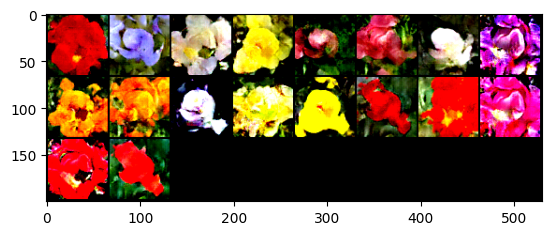

100%|██████████| 103/103 [00:24<00:00,  4.15it/s]


epoch: 47, lossD:0.4611382652254938, lossG:6.405469051842551,lossG_fake:3.1990125517822006, lossG_real:3.2064564812530594 ,equality:-0.007443929470858812


evaluate:121.15496826171875,kid_mean:0.08801838010549545, kid_std:0.03822968155145645,kid_:(tensor(0.0880), tensor(0.0382))


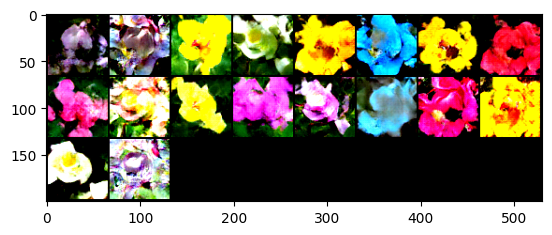

100%|██████████| 103/103 [00:24<00:00,  4.15it/s]


epoch: 48, lossD:0.3847966419840322, lossG:6.4768076267057255,lossG_fake:3.2457219674749282, lossG_real:3.2310856713832004 ,equality:0.014636296091727896


evaluate:120.6527099609375,kid_mean:0.0907057449221611, kid_std:0.04125209525227547,kid_:(tensor(0.0907), tensor(0.0413))


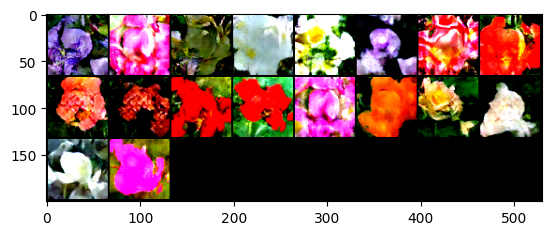

100%|██████████| 103/103 [00:24<00:00,  4.14it/s]


epoch: 49, lossD:0.32001999461824454, lossG:6.475009186753949,lossG_fake:3.3044749261106103, lossG_real:3.170534237495904 ,equality:0.13394068861470654


evaluate:121.66297912597656,kid_mean:0.07908331602811813, kid_std:0.04097051918506622,kid_:(tensor(0.0791), tensor(0.0410))


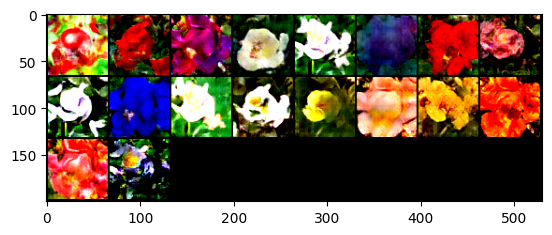

In [44]:
lossesD = []
lossesG = []

raw_lossesD = []
raw_lossesG = []
lossesG_fake = []
lossesG_real = []

equality = 0.0
sum_equality = 0.0
d_equality = []

relu = torch.nn.ReLU()

fid_ = []
kid_mean_ = []
kid_std_ = []
kid_score = []
for epoch in range(opt.n_epoch):
    running_lossD = 0.0 #損失関数初期化
    running_lossG = 0.0
    lossG_fake_running = 0.0
    lossG_real_running = 0.0

    #sum_equality += equality
    equality = 0.0
   # for i , (real_imgs, _) in enumerate(tqdm.tqdm(dataloader, position = 0)):#celebA
    for i , real_imgs in enumerate(tqdm.tqdm(dataloader, position = 0)):#flower
        real_imgs = real_imgs.to(device)
        batch_size = real_imgs.size()[0]
        noise = torch.randn(batch_size, opt.z_dim, 1, 1).to(device)

        #train discriminator

        netD.zero_grad()
        output_real = netD(real_imgs)

        #lossD_real = criterion(output, labels_real)
        lossD_real = torch.mean(relu(1.0 - output_real))


        fake_imgs = netG(noise)##not train  output_fake_d
        output_fake_d = netD(fake_imgs.detach())#not train  output_fake_d

        #lossD_fake = criterion(output, labels_fake)
        lossD_fake = torch.mean(relu(1.0 + output_fake_d))


        lossD = lossD_real + lossD_fake
        #lossD = torch.mean(torch.log(torch.sigmoid(output_real)))- torch.mean(torch.log(torch.sigmoid(output_fake_d)))  #not train  output_fake_d
        lossD.backward()
        optimizerD.step()

        #train generator

        netG.zero_grad()#勾配初期

        output_fake_g = netD(fake_imgs)#train  output_fake_g
        output_real = netD(real_imgs)

        lossG_fake = torch.mean(relu(1.0 - output_fake_g))
        lossG_real = torch.mean(relu(1.0 + output_real))
        #lossG =  torch.mean(torch.log(torch.sigmoid(output_fake_g - output_real))) #- torch.mean(torch.log(torch.sigmoid(output_real)))#train  output_fake_g
        lossG =    lossG_real + lossG_fake


        lossG.backward()
        optimizerG.step()

        # save loss

        running_lossD += lossD.item()
        running_lossG += lossG.item()

        raw_lossesD.append(lossD.item())
        raw_lossesG.append(lossG.item())

        lossG_fake_running += lossG_fake.item()
        lossG_real_running += lossG_real.item()



    running_lossD /=len(dataloader)
    running_lossG /=len(dataloader)

    lossG_fake_running /= len(dataloader)
    lossG_real_running /= len(dataloader)
#equality
    equality = ( lossG_fake_running - lossG_real_running  )
    d_equality.append(equality)


    print("epoch: {}, lossD:{}, lossG:{},lossG_fake:{}, lossG_real:{} ,equality:{}".format(epoch, running_lossD, running_lossG,lossG_fake_running,lossG_real_running,equality))#-->,lossG_fake:{}, lossG_real:{},lossG_fake_running,lossG_real_running
    lossesD.append(running_lossD)
    lossesG.append(running_lossG)

    lossesG_fake.append(lossG_fake_running)
    lossesG_real.append(lossG_real_running)

     #evaluate GAN
    fake_imgs_1 = fake_imgs.detach()
    real_imgs_1 = real_imgs.to(dtype=torch.uint8).cpu()
    fake_imgs_1 = fake_imgs_1.to(dtype=torch.uint8).cpu()
    fid.update(real_imgs_1, real=True)
    fid.update(fake_imgs_1, real=False)
    eval = fid.compute()

    kid.update(real_imgs_1, real=True)
    kid.update(fake_imgs_1, real=False)
    kid_ = kid.compute()
    kid_mean, kid_std = kid.compute()



    print("evaluate:{},kid_mean:{}, kid_std:{},kid_:{}".format(eval, kid_mean, kid_std, kid_))
    fid_.append(eval)
    kid_mean_.append(kid_mean)
    kid_std_.append(kid_std)
    kid_score.append(kid_)
    #show fake image
    grid_imgs = vutils.make_grid(fake_imgs[:24].detach()+0.5)
    grid_imgs_arr = grid_imgs.cpu().numpy()
    plt.imshow(np.transpose(grid_imgs_arr, (1,2,0)))
    plt.show()

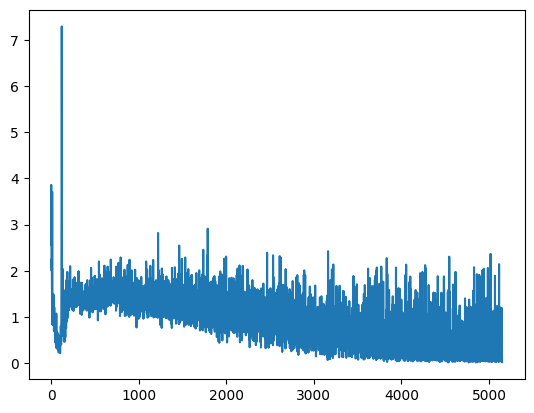

In [45]:
plt.plot(raw_lossesD)

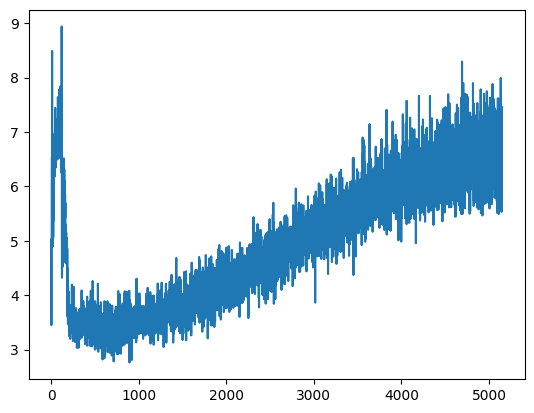

In [46]:
plt.plot(raw_lossesG)

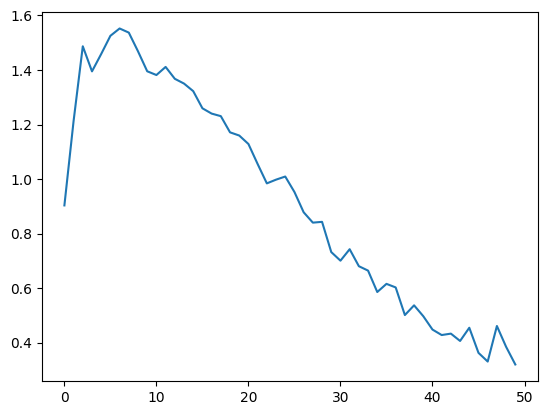

In [47]:
plt.plot(lossesD)

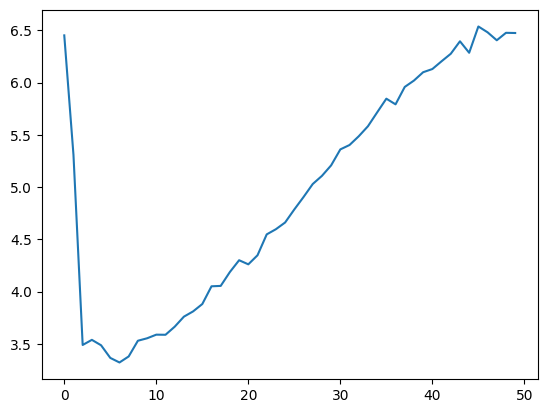

In [48]:
plt.plot(lossesG)

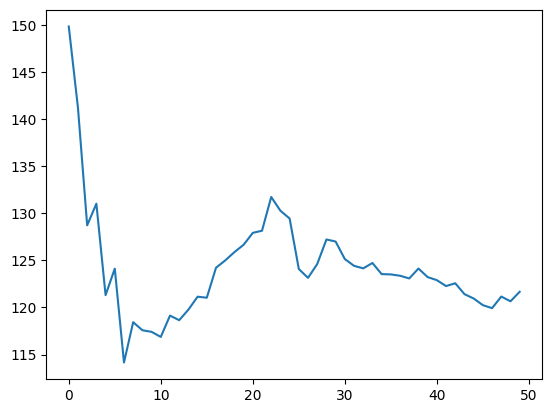

In [49]:
plt.plot(fid_)

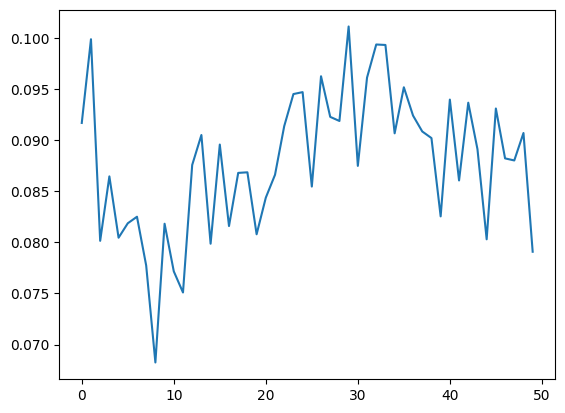

In [50]:
plt.plot(kid_mean_)

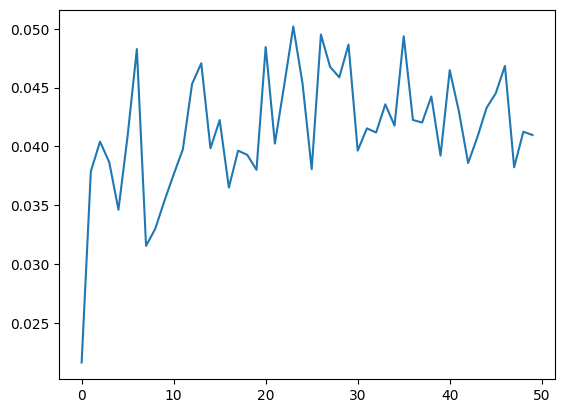

In [51]:
plt.plot(kid_std_)

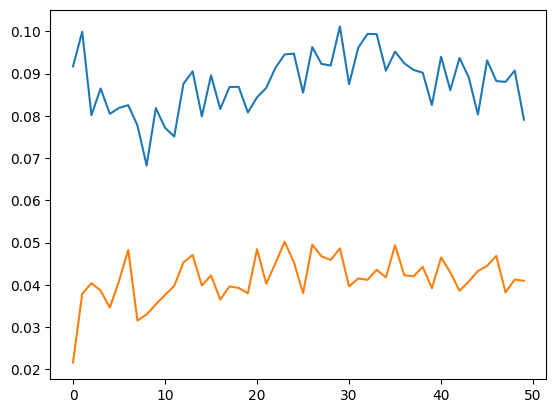

In [52]:
plt.plot(kid_score)

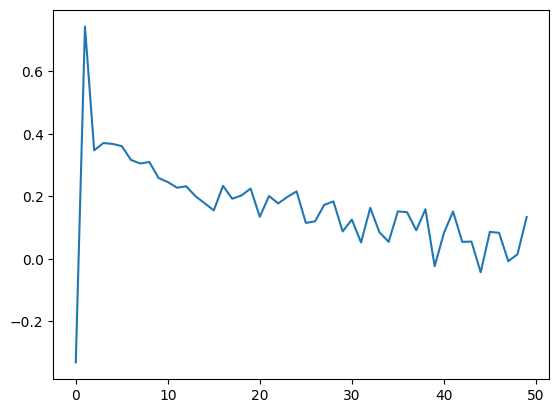

In [53]:
plt.plot(d_equality)

In [54]:

real_imgs = real_imgs.to(dtype=torch.uint8).cpu()
fake_imgs = fake_imgs.to(dtype=torch.uint8).cpu()
fid.update(real_imgs, real=True)
fid.update(fake_imgs, real=False)
fid.compute()

kid.update(real_imgs, real=True)
kid.update(fake_imgs, real=False)
kid.compute()

(tensor(0.0895), tensor(0.0473))